# Импорт зависимостей

In [1]:
%load_ext autoreload
%autoreload 2

In [42]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
import os
import sys
sys.path.append(os.pardir)
STYLEGAN_DIR = os.path.join(os.pardir, "src", "stylegan2_ada_pytorch")
sys.path.append(STYLEGAN_DIR)

from PIL import Image
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
import pickle
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch.nn as nn

from src.stylegan2_ada_pytorch.stylegan2_models.image_aligner.face_alignment import image_align
from src.stylegan2_ada_pytorch.stylegan2_models.image_aligner.landmarks_detector import LandmarksDetector
from stylegan2_models.e4e.model_utils import load_e4e_standalone

from src.image_projector import ImageProjector
from src.utils import get_image, interpolate, plot_image, plot_images_in_row

In [3]:
import warnings
warnings.filterwarnings('ignore')

## Кроп изображений

In [4]:
STYLEGAN_DIR = os.path.join(os.pardir, "src", "stylegan2_ada_pytorch")
LANDMARKS_MODEL_PATH = os.path.join(STYLEGAN_DIR, "pretrained_models", "shape_predictor_68_face_landmarks.dat")
RAW_IMAGES_DIR = os.path.join(os.pardir, "raw_images")
ALIGNED_IMAGES_DIR = os.path.join(os.pardir, "aligned_images")
STYLES_DIR = os.path.join(os.pardir, "styles")

landmarks_detector = LandmarksDetector(LANDMARKS_MODEL_PATH)
for celeb in os.listdir(RAW_IMAGES_DIR):
  celeb_folder = os.path.join(RAW_IMAGES_DIR, celeb)
  save_path = os.path.join(ALIGNED_IMAGES_DIR, celeb)
  os.makedirs(save_path, exist_ok=True)
  for i, img_name in enumerate(os.listdir(celeb_folder)):
      if img_name == ".ipynb_checkpoints":
        continue
      raw_img_path = os.path.join(celeb_folder, img_name)
      for face_landmarks in landmarks_detector.get_landmarks(raw_img_path):
          aligned_face_path = os.path.join(save_path, f"{i}.jpg")
          image_align(raw_img_path, aligned_face_path, face_landmarks)
          break

## Проекция изображений

Спроецируем оригинальные изображения в латентное пространство модели

In [5]:
e4e_model, _ = load_e4e_standalone(os.path.join(STYLEGAN_DIR, "pretrained_models", "e4e_ffhq_encode.pt"))

In [6]:
device = "cuda:0"
model_path = os.path.join(STYLEGAN_DIR, "pretrained_models", "ffhq.pkl")

with open(model_path, 'rb') as f:
    G = pickle.load(f)['G_ema'].cuda()

In [7]:
arcface_model_path = os.path.join(STYLEGAN_DIR, "pretrained_models", "ms1mv3_arcface_r50_fp16.pth")

image_projector = ImageProjector(
    e4e_model,
    G,
    arcface_model_path,
    use_arcface=False,
    device=device
)

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /home/ildar.azamatov/projects/itmo/itmo-generative-models/.venv/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


In [8]:
SAVE_PATH = os.path.join(os.pardir, "latents")

# Lists to store image plots
original_imgs = []
projected_imgs = []
latents = []

for persone in sorted(os.listdir(ALIGNED_IMAGES_DIR)):
    person_images = os.path.join(ALIGNED_IMAGES_DIR, persone)
    save_folder = os.path.join(SAVE_PATH, persone)
    os.makedirs(save_folder, exist_ok=True)

    for image_name in os.listdir(person_images):
        image_path = os.path.join(person_images, image_name)
        orig_tensor, proj_tensor, latent = image_projector.project_image_to_latent_space(
            image_path,
            num_steps=100, 
            learning_rate=0.01,
            reg_w = 5e5,
            rec_w = 0.5,
            lpips_w = 1,
        )
        
        original_imgs.append(get_image(orig_tensor))
        projected_imgs.append(get_image(proj_tensor))
        latent_vector = latent
        
        latents.append(latent_vector)
        latent_path = os.path.join(save_folder, f"{image_name[:-4]}.pt")

        torch.save(latent_vector, latent_path)

  0%|                                                                                                                                                               | 0/100 [00:00<?, ?it/s]

Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:14<00:00,  6.70it/s]


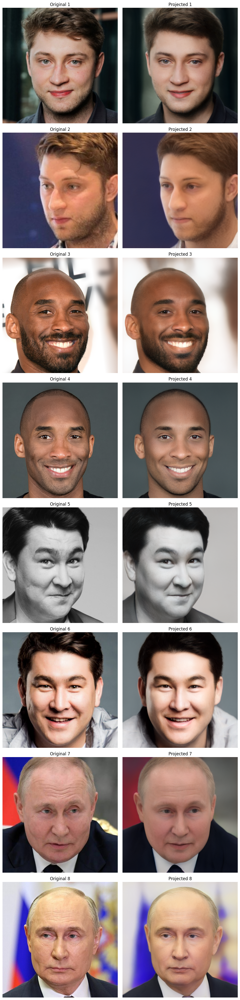

In [9]:
# Plotting all images together
n_images = len(original_imgs)
fig, axs = plt.subplots(n_images, 2, figsize=(10, 5 * n_images))  # Adjust figsize as necessary

for i in range(n_images):
    axs[i, 0].imshow(original_imgs[i])
    axs[i, 0].axis('off')
    axs[i, 0].set_title(f"Original {i+1}")
    
    axs[i, 1].imshow(projected_imgs[i])
    axs[i, 1].axis('off')
    axs[i, 1].set_title(f"Projected {i+1}")

plt.tight_layout()
plt.show()

# Перенос стиля

Спроецируем картинки стиля в латентное пространство

In [10]:
STYLE_SAVE_PATH = os.path.join(os.pardir, "latents_styles")

# Lists to store image plots
style_original_imgs = []
style_projected_imgs = []
style_latents = []

for style_name in sorted(os.listdir(STYLES_DIR)):
    style_path = os.path.join(STYLES_DIR, style_name)
    style_orig_tensor, style_proj_tensor, style_latent = image_projector.project_image_to_latent_space(
        style_path,
        num_steps=100, 
        learning_rate=0.01,
        reg_w = 5e5,
        rec_w = 0.5,
        lpips_w = 1,
    )
    
    style_original_imgs.append(get_image(style_orig_tensor))
    style_projected_imgs.append(get_image(style_proj_tensor))
    style_latent_vector = style_latent
    
    style_latents.append(style_latent_vector)
    style_latent_path = os.path.join(STYLE_SAVE_PATH, f"{style_name[:-4]}.pt")

    torch.save(style_latent_vector, style_latent_path)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:14<00:00,  6.74it/s]


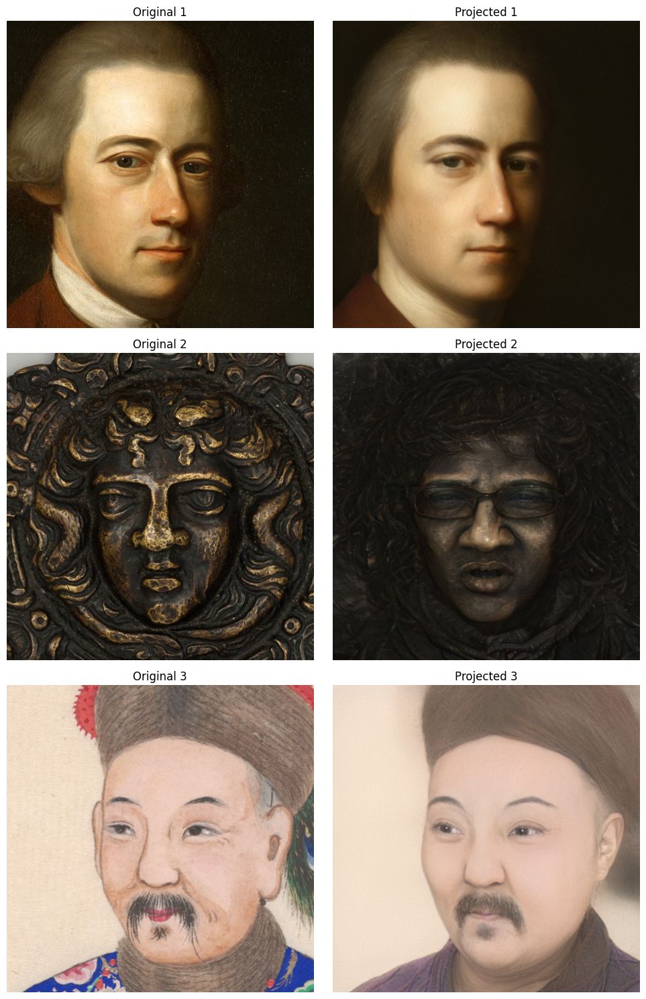

In [11]:
# Plotting all images together
n_images = len(style_original_imgs)
fig, axs = plt.subplots(n_images, 2, figsize=(10, 5 * n_images))  # Adjust figsize as necessary

for i in range(n_images):
    axs[i, 0].imshow(style_original_imgs[i])
    axs[i, 0].axis('off')
    axs[i, 0].set_title(f"Original {i+1}")
    
    axs[i, 1].imshow(style_projected_imgs[i])
    axs[i, 1].axis('off')
    axs[i, 1].set_title(f"Projected {i+1}")

plt.tight_layout()
plt.show()

Для переноса стиля воспользуемся интерполяцией с заменой последних индексов матрицы W

In [14]:
def plot_interpolation_matrix(latents, style_latents, G, psi=0.5, indices=None):
    n_originals = len(latents)
    n_styles = len(style_latents)
    
    fig, axs = plt.subplots(n_originals, n_styles, figsize=(n_styles * 5, n_originals * 5))
    
    for i, orig_latent in enumerate(latents):
        for j, style_latent in enumerate(style_latents):
            interpolated_tensor = interpolate(orig_latent, style_latent, G, psi=psi, indeces=indices)
            img = get_image(interpolated_tensor)  # Assuming plot_image now returns an image object
            axs[i, j].imshow(img)
            axs[i, j].axis('off')
    
    plt.show()

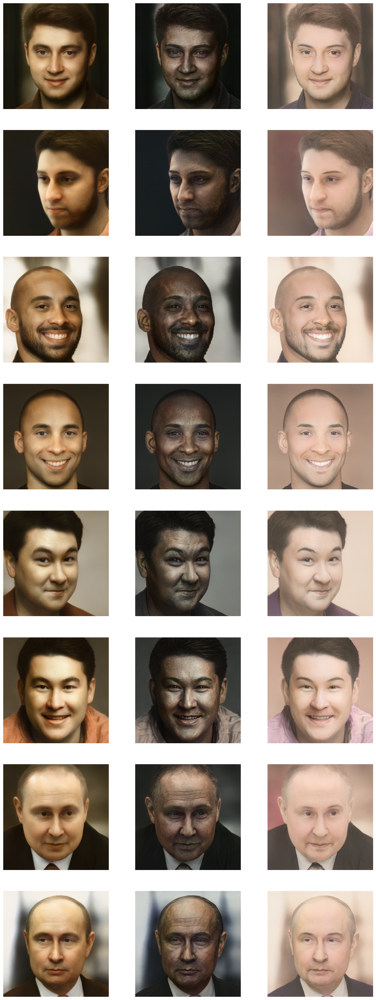

In [16]:
indices = [9, 10, 11, 12, 13, 14, 15, 16, 17]
psi = 0.1

plot_interpolation_matrix(latents, style_latents, G, psi, indices)

# Перенос эмоций

In [17]:
EMOTIONS_PATH = os.path.join(os.pardir, "latents_emotions")

emotions = ["emotion_happy.npy", "emotion_surprise.npy", "emotion_angry.npy"]
emotion_weight = 15

emotion_latents = [
    torch.tensor(
        np.expand_dims(
            np.load(os.path.join(EMOTIONS_PATH, emotion)), 
            axis=0
        ), 
        dtype=torch.float32, 
        device=device, 
        requires_grad=True
) * emotion_weight for emotion in emotions]

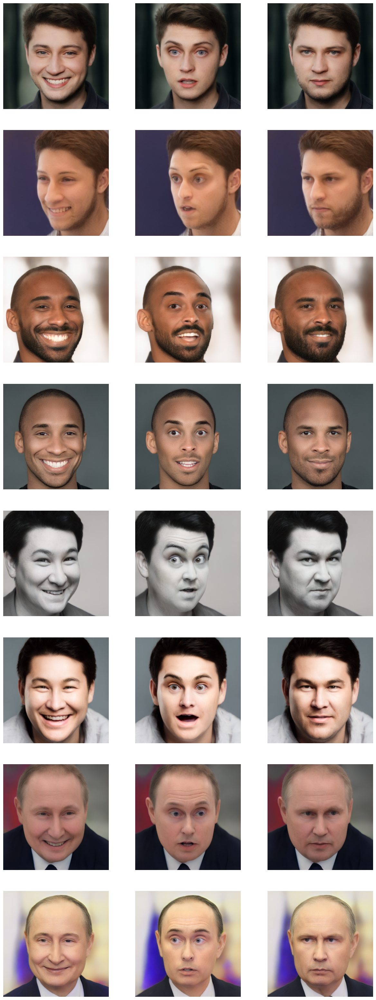

In [18]:
indices = [4, 5, 6, 7, 8, 9]
psi = 0.7

plot_interpolation_matrix(latents, emotion_latents, G, psi, indices)

# Перенос лица

Для переноса лица без изменения остальных составляющих фото мы добавляем Arcface Loss в нашу оптимизацию

In [19]:
arcface_image_projector = ImageProjector(
    e4e_model,
    G,
    arcface_model_path,
    use_arcface=True,
    device=device
)

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /home/ildar.azamatov/projects/itmo/itmo-generative-models/.venv/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


Создадим матрицу переносов всех 4 персон

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  6.03it/s]


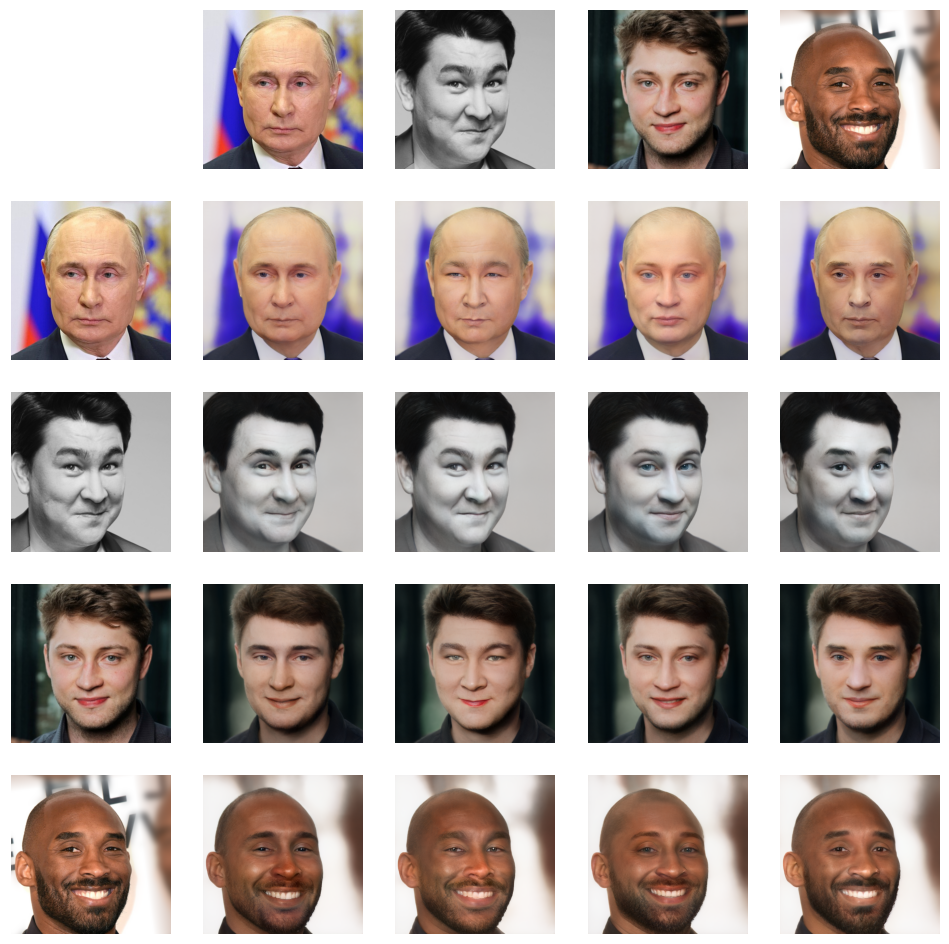

In [67]:
images = [
    os.path.join(ALIGNED_IMAGES_DIR, "putin", "0.jpg"),
    os.path.join(ALIGNED_IMAGES_DIR, "musagaliev", "1.jpg"),
    os.path.join(ALIGNED_IMAGES_DIR, "babushkin", "1.jpg"),
    os.path.join(ALIGNED_IMAGES_DIR, "bryant", "1.jpg"),
]

# Preload all images to PIL Images for faster processing
image_pils = [Image.open(img) for img in images]

# Prepare a grid to hold the generated images
n = len(images)
fig, axes = plt.subplots(n + 1, n + 1, figsize=(12, 12))

for i in range(n + 1):
    for j in range(n + 1):
        if i == 0 and j == 0:
            # Leave the top-left cell empty
            axes[i][j].axis('off')
        elif i == 0:
            # First row, after the first cell, load original images in top row
            axes[i][j].imshow(image_pils[j-1])
        elif j == 0:
            # First column, after the first cell, load original images in first column
            axes[i][j].imshow(image_pils[i-1])
        else:
            # Generate swapped images for the rest
            _, proj_tensor, _ = arcface_image_projector.project_image_to_latent_space(
                images[i-1],  # source image
                images[j-1],  # target image
                num_steps=100, 
                learning_rate=0.01,
                reg_w=5e5,
                rec_w=1,
                lpips_w=2,
                arcface_w=1
            )
            # Convert tensor to PIL Image for display
            axes[i][j].imshow(get_image(proj_tensor))

        axes[i][j].axis('off')

plt.show()